Part 1. Data exploration

In [1]:
import numpy as np
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec

In [2]:
train=pd.read_csv('D:/Users/huawei/Documents/GitHub/FLIP00/Data/train.csv',header=0)
test=pd.read_csv('D:/Users/huawei/Documents/GitHub/FLIP00/Data/test.csv',header=0)

train.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0.0,3,13,16
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0.0,8,32,40
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0.0,5,27,32
3,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0.0,3,10,13
4,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0.0,0,1,1


1. Missing value check

In [3]:
print(train.info())
print(test.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    10886 non-null  object 
 1   season      10886 non-null  int64  
 2   holiday     10886 non-null  int64  
 3   workingday  10886 non-null  int64  
 4   weather     10886 non-null  int64  
 5   temp        10886 non-null  float64
 6   atemp       10886 non-null  float64
 7   humidity    10886 non-null  int64  
 8   windspeed   10886 non-null  float64
 9   casual      10886 non-null  int64  
 10  registered  10886 non-null  int64  
 11  count       10886 non-null  int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 1020.7+ KB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6493 entries, 0 to 6492
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    6493 non-null   object 
 1   season      6

The data has no missing values.

2.Outlier check

In [4]:
# Statistical description
train.describe().T

,count,mean,std,min,25%,50%,75%,max
season,10886.0,2.506614,1.116174,1.00,2.0000,3.000,4.0000,4.0000
holiday,10886.0,0.028569,0.166599,0.00,0.0000,0.000,0.0000,1.0000
workingday,10886.0,0.680875,0.466159,0.00,0.0000,1.000,1.0000,1.0000
weather,10886.0,1.418427,0.633839,1.00,1.0000,1.000,2.0000,4.0000
temp,10886.0,20.230860,7.791590,0.82,13.9400,20.500,26.2400,41.0000
atemp,10886.0,23.655084,8.474601,0.76,16.6650,24.240,31.0600,45.4550
humidity,10886.0,61.886460,19.245033,0.00,47.0000,62.000,77.0000,100.0000
windspeed,10886.0,12.799395,8.164537,0.00,7.0015,12.998,16.9979,56.9969
casual,10886.0,36.021955,49.960477,0.00,4.0000,17.000,49.0000,367.0000
registered,10886.0,155.552177,151.039033,0.00,36.0000,118.000,222.0000,886.0000


In [5]:
#themes = ['deep', 'muted', 'pastel', 'bright', 'dark', 'colorblind']
sns.set_palette(sns.color_palette('pastel'), 10)

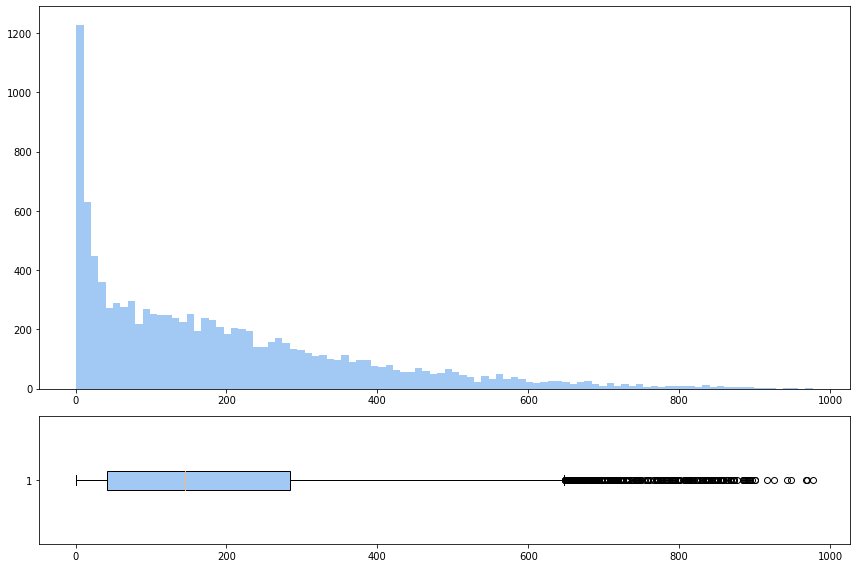

In [6]:
fig = plt.figure(figsize=(12,8))
gs = gridspec.GridSpec(2, 1, height_ratios=[3, 1])
plt.subplots_adjust( bottom=0,  wspace=0, hspace=0)
ax0 = plt.subplot(gs[0])
ax0.hist(train['count'],bins=100)
ax1 = plt.subplot(gs[1], sharex = ax0)
ax1.boxplot(train['count'],vert=False,patch_artist=True)
plt.tight_layout()
plt.savefig('Count distribution.png')

Count: mean 191, standard deviation 181, the 50% quantile is 145, the 75% quantile is 284, and the maximum is 977, indicating that there is a long tail on the right.
The overall distribution skew is quite serious, which needs to be dealt with in order to avoid overfitting at last.
According to the principle of 3sigma, we exclude the data beyond 3 standard deviations, then take the log transform of count and look at the distribution after the transformation.


Text(0.5, 1.0, 'count_log')

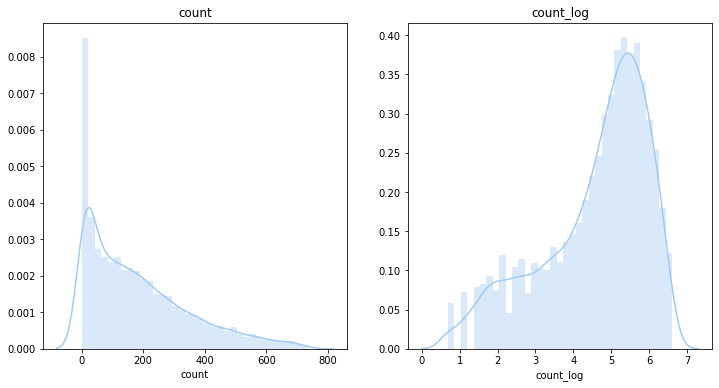

In [7]:
# Data values greater than μ+3σ are taken as outliers
train=train[np.abs(train['count']-train['count'].mean())<=3*train['count'].std()]

train['count'+'_log'] = np.log1p(train['count'])
f, [ax1, ax2] = plt.subplots(1,2, figsize=(12,6))
sns.distplot(train['count'], ax=ax1)
ax1.set_title('count')
sns.distplot(train['count'+'_log'], ax=ax2)
ax2.set_title('count'+'_log')
plt.savefig('Count distribution compare.png')

We see that after the transformation, the distribution of the graph is less skewed and the differences are smaller.

3.Features of decomposition

In [8]:
#To facilitate data cleaning, we combine the training set with the test set.
data=pd.concat([train,test],ignore_index=True)

#Divide time into year, month, day, week, and hour.
data['date']=data.datetime.apply(lambda x:x.split()[0])
data['hour']=data.datetime.apply(lambda x:x.split()[1].split(':')[0]).astype('int')
data['year']=data.datetime.apply(lambda x:x.split()[0].split('-')[0]).astype('int')
data['month']=data.datetime.apply(lambda x:x.split()[0].split('-')[1]).astype('int')
data['weekday']=data.date.apply( lambda x : datetime.strptime(x,'%Y-%m-%d').isoweekday())


[Text(0.5, 0, 'windspeed'), Text(0.5, 1.0, 'The wind speed distribution')]

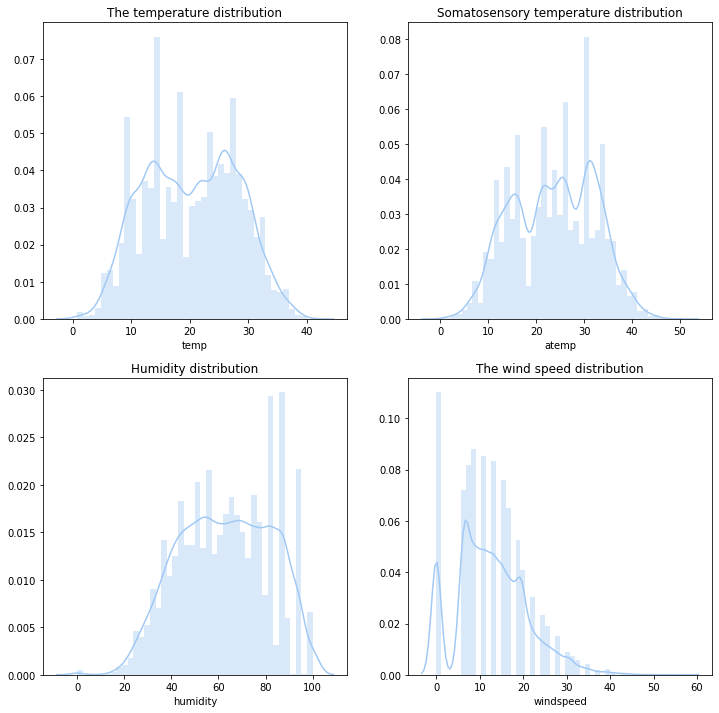

In [9]:
fig,axes=plt.subplots(2,2)
fig.set_size_inches(12,12)
sns.distplot(data['temp'],ax=axes[0,0])
sns.distplot(data['atemp'],ax=axes[0,1])
sns.distplot(data['humidity'],ax=axes[1,0])
sns.distplot(data['windspeed'],ax=axes[1,1])
axes[0,0].set(xlabel='temp',title='The temperature distribution')
axes[0,1].set(xlabel='atemp',title='Somatosensory temperature distribution')
axes[1,0].set(xlabel='humidity',title='Humidity distribution')
axes[1,1].set(xlabel='windspeed',title='The wind speed distribution')

plt.savefig('Features distribution analysis.png')


In [101]:
#The cross validation method is used to adjust the parameters of the random forest. The optimal parameters are selected from the internal bagging framework and tree respectively, and then the model is established for prediction.
#The same features of year, month, season, temperature, humidity, etc. all affect wind speed, so these features are chosen here for prediction.
speed_null=data[data['windspeed']==0]
speed_notnull=data[data['windspeed']!=0]

windspeed_trainX=speed_notnull[['season','weather','humidity','month','temp','year','atemp']]
windspeed_trainY=speed_notnull['windspeed']
windspeed_testX=speed_null[['season','weather','humidity','month','temp','year','atemp']]

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_log_error

rf=RandomForestRegressor(random_state=10)

param1={'n_estimators':list(range(100,500,50))}
model1=GridSearchCV(estimator = rf,param_grid = param1, scoring='neg_mean_squared_log_error',cv=5)
model1.fit(windspeed_trainX,windspeed_trainY)
model1.best_score_
model1.best_params_
param2={'max_depth':list(range(3,10,1)),'min_samples_split':list(range(10,20,2))}
model2=GridSearchCV(estimator = RandomForestRegressor(random_state=10,n_estimators=450),param_grid = param2, scoring='neg_mean_squared_log_error',cv=5)
model2.fit(windspeed_trainX,windspeed_trainY)
model2.best_score_
model2.best_params_

speed_model=RandomForestRegressor(n_estimators=450,random_state=10,max_depth=9,min_samples_split=10)
speed_model.fit(windspeed_trainX,windspeed_trainY)
windspeed_testY=speed_model.predict(windspeed_testX)
data.loc[data.windspeed==0,'windspeed']=windspeed_testY


[Text(0.5, 0, 'windspeed'), Text(0.5, 1.0, 'The wind speed distribution')]

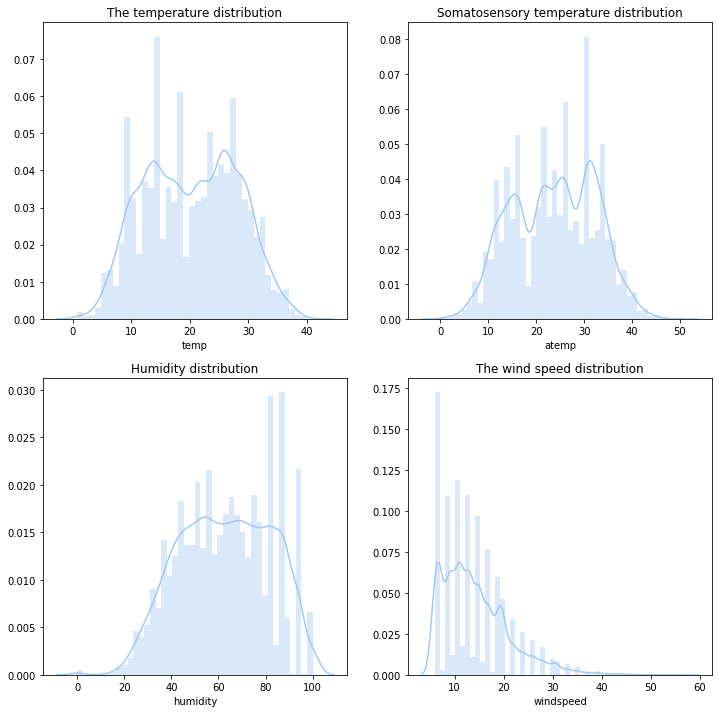

In [102]:
fig,axes=plt.subplots(2,2)
fig.set_size_inches(12,12)
sns.distplot(data['temp'],ax=axes[0,0])
sns.distplot(data['atemp'],ax=axes[0,1])
sns.distplot(data['humidity'],ax=axes[1,0])
sns.distplot(data['windspeed'],ax=axes[1,1])
axes[0,0].set(xlabel='temp',title='The temperature distribution')
axes[0,1].set(xlabel='atemp',title='Somatosensory temperature distribution')
axes[1,0].set(xlabel='humidity',title='Humidity distribution')
axes[1,1].set(xlabel='windspeed',title='The wind speed distribution')

plt.savefig('After features distribution analysis.png')


Part 2. Data visualization

1. Time characteristic analysis

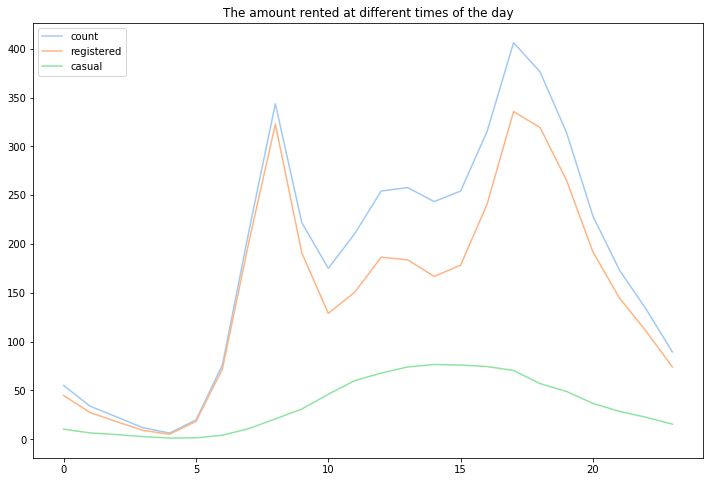

In [108]:
group_hour=data.groupby(data.hour)
hour_mean=group_hour[['count','registered','casual']].mean()
fig=plt.figure(figsize=(12,8))
plt.plot(hour_mean['count'],label='count')
plt.plot(hour_mean['registered'],label='registered')
plt.plot(hour_mean['casual'],label='casual')

plt.title('The amount rented at different times of the day')
plt.legend(loc=2)
plt.savefig('Time trends_day.png')


As can be seen from the graph above, there are two peaks in the graph, one is from 7-8 in the morning, the other is from 5-6 in the afternoon, which is the morning peak and the evening peak respectively, which is in line with the actual situation.
Let's take a look at the difference in time of day between working and non-working days.

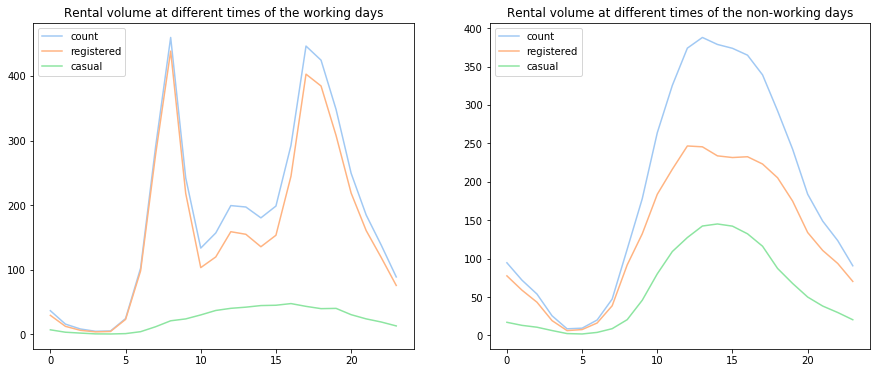

In [112]:
workingday_df=data[data['workingday']==1]
group_working=workingday_df.groupby('hour')
hour1_mean=group_working[['count','registered','casual']].mean()
noworkingday_df=data[data['workingday']==0]
group_noworking=noworkingday_df.groupby('hour')
hour2_mean=group_noworking[['count','registered','casual']].mean()

plt.figure(figsize=(15,6))
plt.subplot(1,2,1)
plt.plot(hour1_mean['count'],label='count')
plt.plot(hour1_mean['registered'],label='registered')
plt.plot(hour1_mean['casual'],label='casual')
plt.title('Rental volume at different times of the working days')
plt.legend(loc=2)
plt.subplot(1,2,2)
plt.plot(hour2_mean['count'],label='count')
plt.plot(hour2_mean['registered'],label='registered')
plt.plot(hour2_mean['casual'],label='casual')
plt.title('Rental volume at different times of the non-working days')
plt.legend(loc=2)
plt.savefig('time trends_weekday.png')


Through the trend comparison between weekdays and non-weekdays, we find that the rush hour is obvious on weekdays, while people prefer to go out after 2-3 PM on non-weekdays.

From a year's trend, spring, summer and autumn are the years with high rental amount, especially in June.
And the trend is about the same from year to year;
But across two years, two-year leases are rising.

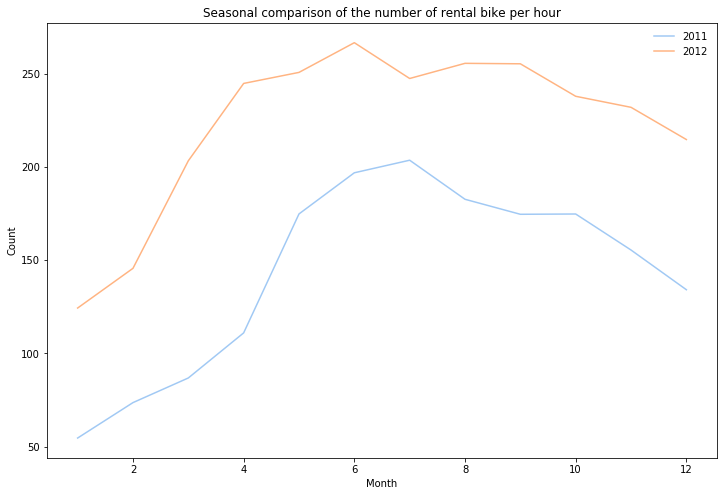

In [122]:
data_year=data.groupby(['hour','year']).mean().unstack()['count']

plt.figure(figsize=(12,8))
plt.plot(data_year)
plt.xlabel('Month')
plt.ylabel('Count')
plt.title('Monthly comparison of the number of rental bike per hour')
plt.legend(data['year'].unique(),loc=0,frameon=False)
#plt.xticks( 'Jan', 'Feb', 'Mar', 'Apr','May','Jun', 'Jul', 'Aug','Sep', 'Oct', 'Nov', 'Dec')
plt.savefig('month.png')
plt.show()

Visualization of the relationship between bike rental number and time

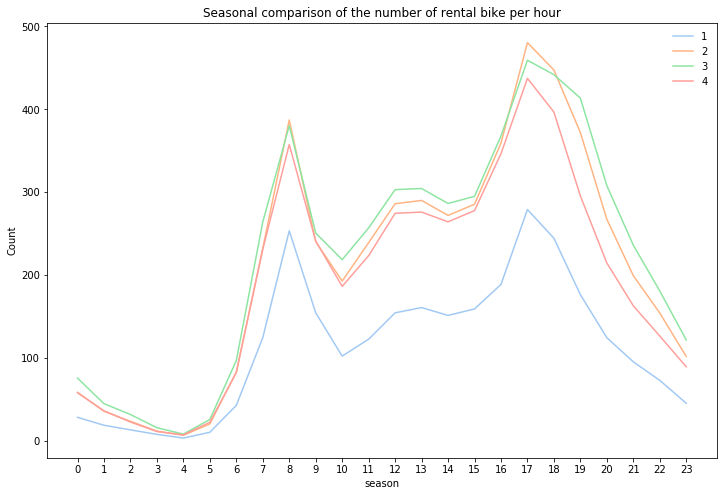

In [124]:
data_season=data.groupby(['hour','season']).mean().unstack()['count']

plt.figure(figsize=(12,8))
plt.plot(data_season)
plt.xlabel('season')
plt.ylabel('Count')
plt.title('Seasonal comparison of the number of rental bike per hour')
plt.legend(data['season'].unique(),loc=0,frameon=False)
plt.xticks( np.arange(24) )h
plt.savefig('season.png')
plt.show()

从上图我们可以看出，春天的使用量明显偏少，可能是温度较低的原因，同时，早上八点和晚上5点左右使用较多

As can be seen from the above diagram, the usage is obviously lower in spring, probably due to the lower temperature. Meanwhile, the usage is higher around 8 am and 5 PM

In [81]:
EDA_week=EDA.groupby(['Hour','Week']).mean().unstack()['count']

plt.figure(figsize=(12,8))
plt.plot(EDA_week)
plt.xlabel('Time')
plt.ylabel('Count')
plt.title('Seasonal comparison of the number of rental bike per hour')
plt.legend(EDA['Week'].unique(),loc=0,frameon=False)
plt.xticks( np.arange(24) )
plt.savefig('week.png')
plt.show()

NameError: name 'EDA' is not defined

从上图我们可以看出，周一到周五中，一天中早上8-9点和下午5-7点，使用量比较多，可能是早上上班时间和晚上下班时间导致的，同时包含外出吃饭的原因，而对于周末，时间比较集中，基本在11点到下午5点左右使用量比较多，这个时间估计是大家的休闲时间。

From above we can see, from Monday to Friday, 8 in the morning of the day - 9 am and 5 to 7 PM, usage is more, may be caused by time going to work in the morning and evening after work time, include the reason of eating out at the same time, for the weekend, time is more focused, basic usage around 11 PM to 5 PM,
This time is supposed to be everyone's leisure time.

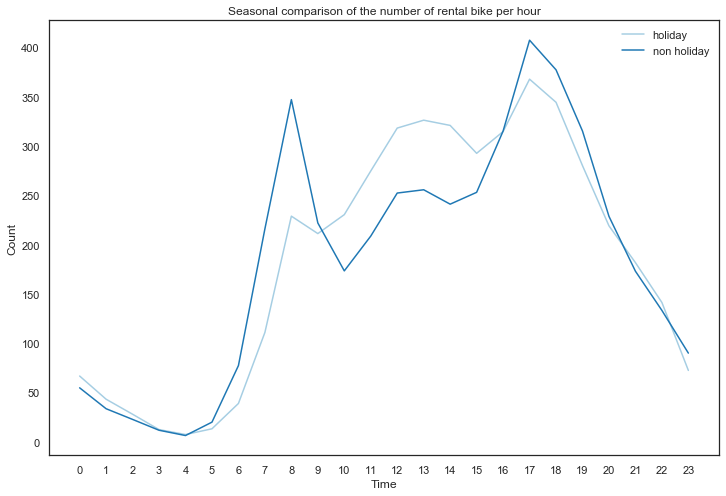

In [159]:
data_holiday = data.groupby(['Hour', 'Holiday']).mean().unstack()['count']

plt.figure(figsize=(12,8))
plt.plot(EDA_holiday)
plt.xlabel('Time')
plt.ylabel('Count')
plt.title('Seasonal comparison of the number of rental bike per hour')
plt.legend(list(data_holiday),loc=0,frameon=False)
plt.xticks( np.arange(24) )
plt.savefig('hol.png')
plt.show()




节假日和非节假日使用时间比较接近，但是节假日使用明显高于非节假日。

明显可以看到，周末和工作日，单车的使用主要集中在不同时间

The influence of temperature, humidity and demeanor on the number of shared bike rentals

D:\Program Files\Anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
D:\Program Files\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]


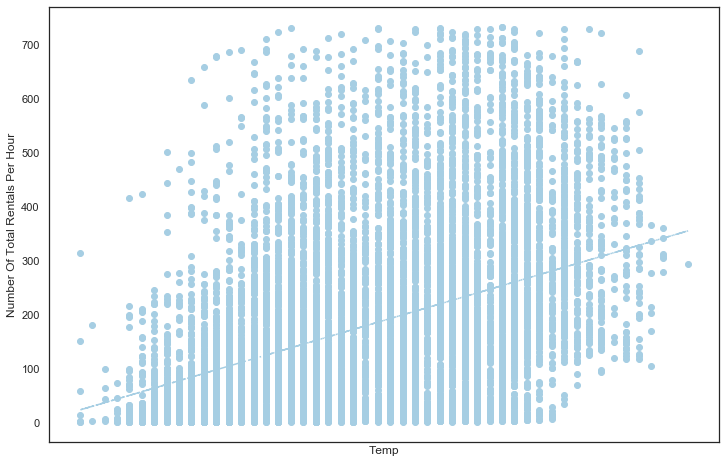

In [161]:
#Temperature
plt.figure(figsize=(12,8))
plt.scatter(x="temp", y="count", data=train)
plt.xlabel('Temp')
plt.ylabel('Number Of Total Rentals Per Hour')
plt.xticks([])
#plt.title('Overview of the Number of Total Rentals Per Hour')
poly = np.polyfit(data['temp'], train['count'], 1)
z=np.polyval(poly, data['temp'])
plt.plot(data['temp'], z, '-.')
plt.savefig('Temperature.png')
plt.show()

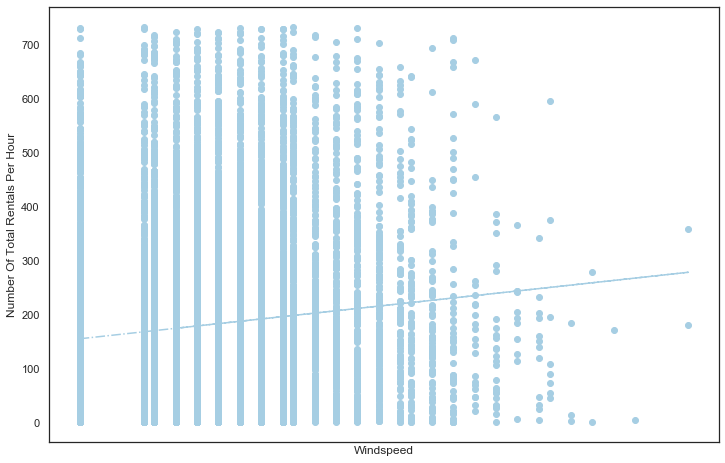

In [162]:
#Windspeed
plt.figure(figsize=(12,8))
plt.scatter(x="windspeed", y="count", data=train)
plt.xlabel('Windspeed')
plt.ylabel('Number Of Total Rentals Per Hour')
plt.xticks([])
#plt.title('Overview of the Number of Total Rentals Per Hour')
poly = np.polyfit(data['windspeed'], train['count'], 1)
z=np.polyval(poly, data['windspeed'])
plt.plot(data['windspeed'], z, '-.')
plt.savefig('Windspeed.png')
plt.show()

Text(0, 0.5, 'count')

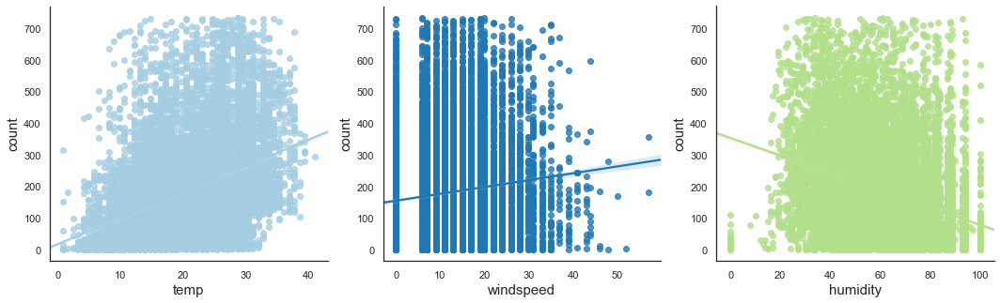

In [163]:

fig,(ax1,ax2,ax3) = plt.subplots(ncols=3)
fig.set_size_inches(18, 5)
sns.set(style='white')
sns.despine()
ax1=sns.regplot(x="temp", y="count", data=data,ax=ax1)
ax2=sns.regplot(x="windspeed", y="count", data=data,ax=ax2)
ax3=sns.regplot(x="humidity", y="count", data=data,ax=ax3)

#ax1.set(xlabel='temp',ylabel='count')
ax1.set_xlabel('temp',fontsize=15)
ax1.set_ylabel('count',fontsize=15)
ax2.set_xlabel('windspeed',fontsize=15)
ax2.set_ylabel('count',fontsize=15)
ax3.set_xlabel('humidity',fontsize=15)
ax3.set_ylabel('count',fontsize=15)
plt.savefig('weather.png')

气温低于10，高于30度，租车人数较少-太冷太热都会抑制租车需求

风速越大，租车人数越少-大风抑制租车需求

空气湿度越高，租车人数越少-干爽的天气骑车比较舒适

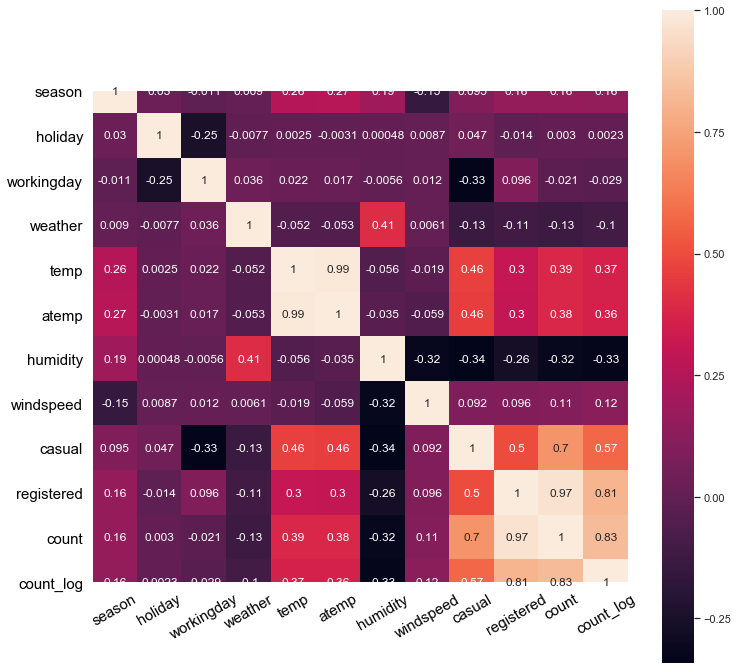

In [164]:
cor=train.corr()

fig=plt.figure(figsize=(12,12))
sns.set(style='white')
sns.heatmap(cor,vmax=1,square=True,annot=True)
plt.xticks(fontsize=15,color='black',rotation=30)
plt.yticks(fontsize=15,color='black')
plt.savefig('cor.png')
plt.show()

In [165]:
cor['count'].sort_values(ascending=False)

count         1.000000
registered    0.966209
count_log     0.832871
casual        0.704764
temp          0.385954
atemp         0.381967
season        0.159801
windspeed     0.106074
holiday       0.002978
workingday   -0.020764
weather      -0.127519
humidity     -0.317028
Name: count, dtype: float64

Part 3.Models

In [166]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,MinMaxScaler

X = data.drop(['count','datetime','registered','casual'],axis=1)
y = data['count']


sc = MinMaxScaler()
X = sc.fit_transform(X)

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.2,random_state = 42)

In [208]:
from sklearn.ensemble import RandomForestRegressor

rfr = RandomForestRegressor()
rfr.fit(X_train, y_train)
rfr_y_predict = rfr.predict(X_test)

# checking the rmsle
rfr_rmsle=np.sqrt(mean_squared_log_error(y_test,rfr_y_predict))
#rfr_acc = accuracy_score(y_test,rfr_y_predict)
print('RandomForestRegressor RMSLE is ',rfr_rmsle)
#print('RandomForestRegressor Accuracy is ',rfr_acc)

D:\Program Files\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
RandomForestRegressor RMSLE is  0.015997648966966104


GradientBoostingRegressor

In [210]:
from sklearn.ensemble import GradientBoostingRegressor

gbr = GradientBoostingRegressor()
gbr.fit(X_train, y_train)
gbr_y_predict = gbr.predict(X_test)

# checking the rmsle
gbr_rmsle=np.sqrt(mean_squared_log_error(y_test,gbr_y_predict))
#gbr_acc = accuracy_score(y_test,gbr_y_predict)
print('GradientBoostingRegressor RMSLE is ',gbr_rmsle)
#print('GradientBoostingRegressor Accuracy is ',gbr_acc)

GradientBoostingRegressor RMSLE is  0.05507132297615649


In [228]:
df_RMSLE=pd.DataFrame(columns=['Models', 'RMSLE'],
data=[['LR',lr_rmsle],['SGDR',sgdr_rmsle],
['Linear SVR',linear_svr_rmsle],['Poly SVR',poly_svr_rmsle],
['RBF SVR',rbf_svr_rmsle],['Uni KNR',uni_knr_rmsle],
['Dis KNR',dis_knr_rmsle],['DTR',dtr_rmsle],
['RFR',rfr_rmsle],['ETR',etr_rmsle],
['GBR',gbr_rmsle]]
)

df_RMSLE['RMSLE']=df_RMSLE['RMSLE'].round(5)

print(df_RMSLE.sort_values(by='RMSLE'))


        Models    RMSLE
0           LR  0.00000
9          ETR  0.01090
8          RFR  0.01600
2   Linear SVR  0.01770
7          DTR  0.01948
1         SGDR  0.03521
10         GBR  0.05507
6      Dis KNR  0.52263
5      Uni KNR  0.57499
4      RBF SVR  1.19468
3     Poly SVR  1.46240


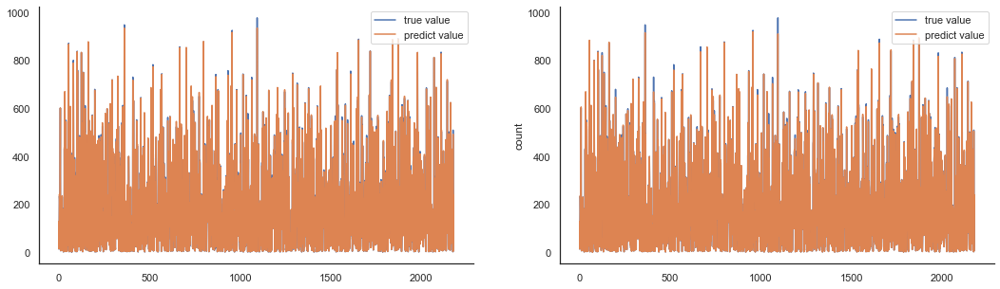

In [227]:
fig,(ax1,ax2) = plt.subplots(ncols=2)
fig.set_size_inches(18, 5)
sns.set(style='white')
sns.despine()
ax1=sns.lineplot(np.arange(len(y_test)),y_test.values,label = 'true value',ax=ax1)
ax1=sns.lineplot(np.arange(len(y_test)),gbr_y_predict,label = 'predict value',ax=ax1)
ax2=sns.lineplot(np.arange(len(y_test)),y_test,label = 'true value',ax=ax2)
ax2=sns.lineplot(np.arange(len(y_test)),rfr_y_predict,label = 'predict value',ax=ax2)

#ax1.set(xlabel='temp',ylabel='count')
#ax1.set_xlabel('temp',fontsize=15)
#ax1.set_ylabel('true value',fontsize=15)
#ax2.set_xlabel('windspeed',fontsize=15)
#ax2.set_ylabel('count',fontsize=15)
#ax3.set_xlabel('humidity',fontsize=15)
#ax3.set_ylabel('count',fontsize=15)


In [220]:
dis_knr_y_predict

array([146.16253907,  29.43361121, 136.77076538, ..., 491.42640387,
         6.99623215, 240.99338352])

In [221]:
y_test

3133     127
5786      13
5224     163
8953     233
8054     222
        ... 
1963     351
5807       2
10061    509
5427       5
7588     239
Name: count, Length: 2178, dtype: int64

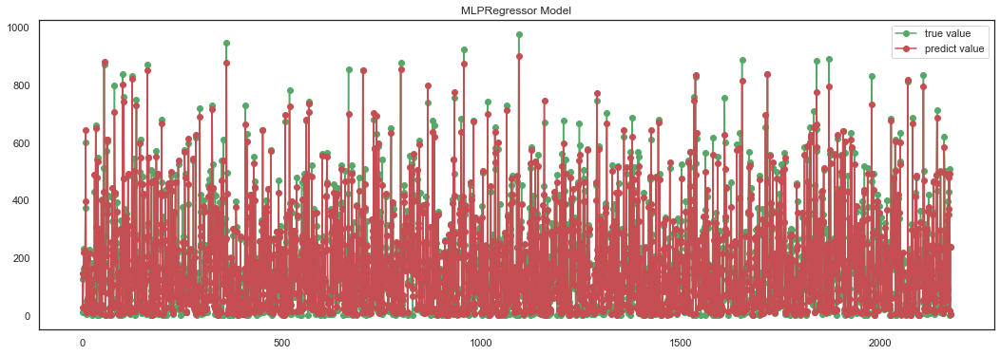

In [224]:
plt.figure(figsize = (18,6))

plt.plot(np.arange(len(y_test)),y_test.values,'go-',label = 'true value')
plt.plot(np.arange(len(y_test)),dis_knr_y_predict,'ro-',label = 'predict value')

plt.title('MLPRegressor Model')
plt.legend()
plt.show()

In [230]:
lr_y_sub = lr.predict(test.drop(['datetime'],axis=1))

ValueError: shapes (6493,8) and (10,) not aligned: 8 (dim 1) != 10 (dim 0)